In [1]:
######## import libraries ########

import pandas as pd
import numpy as np
import sys
import matplotlib.pyplot as plt
from natsort import natsorted
import re
import plotly.graph_objs as go
from plotly.offline import iplot
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import os
from PIL import Image


np.set_printoptions(threshold=sys.maxsize)

# Load the data pkl and sort the columns by filename

data1 = pd.read_pickle('pkl_files\\ad-chega.pkl')
data1 = data1.sort_values(by='filename')






C:\Users\berna\AppData\Local\Temp\ipykernel_24872\1881939982.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


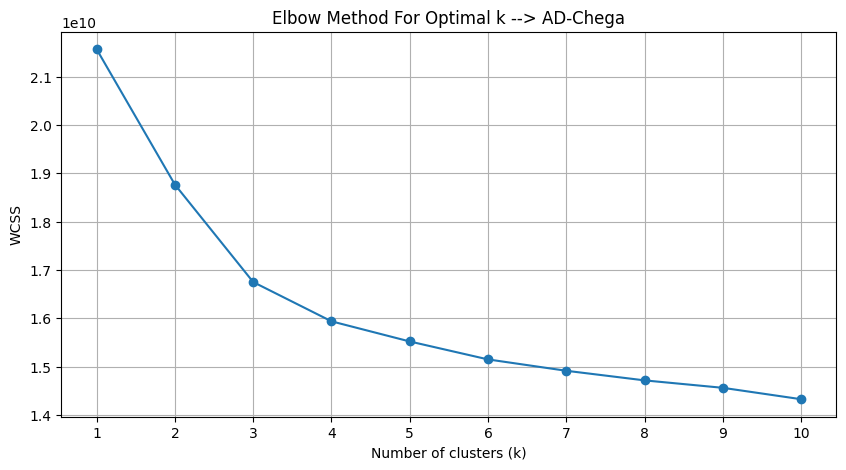

In [2]:

image_embeddings_ad_chega =  np.stack(data1.iloc[:, 5].to_numpy()) # numpy array of image embeddings

# Calculate WCSS for different numbers of clusters to determine the optimal number of clusters
wcss = []
for i in range(1, 11):  # Assuming testing for 1 to 10 clusters
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(image_embeddings_ad_chega)
    wcss.append(kmeans.inertia_)

# Plotting the results onto a line graph
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method For Optimal k --> AD-Chega')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.xticks(range(1, 11))  
plt.grid(True)
plt.show()




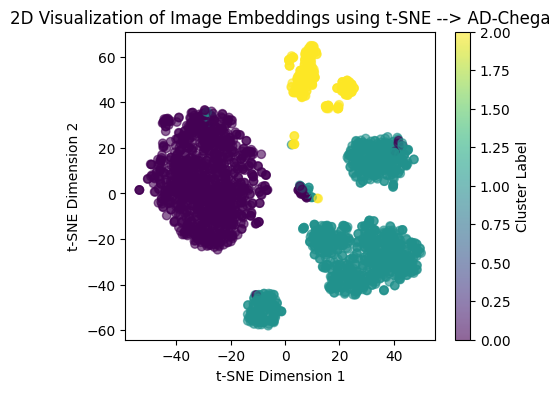

In [3]:
# Step 1: K-means Clustering  --> trying with 3 clusters
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
labels = kmeans.fit_predict(image_embeddings_ad_chega)

# Step 2: Dimensionality Reduction with t-SNE
tsne = TSNE(n_components=2, random_state=42)  # Use n_components=3 for 3D visualization
reduced_data = tsne.fit_transform(image_embeddings_ad_chega)

# Step 3: Plotting the results in 2D
plt.figure(figsize=(5, 4))
scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Cluster Label')
plt.title('2D Visualization of Image Embeddings using t-SNE --> AD-Chega')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

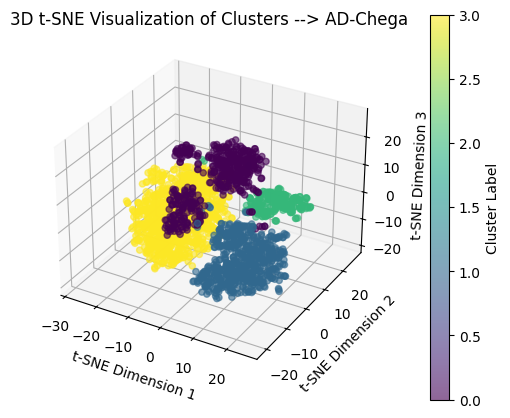

In [4]:
# Perform K-means clustering --> trying now with 4 clusters
kmeans = KMeans(n_clusters=4, random_state=42)
labels = kmeans.fit_predict(image_embeddings_ad_chega)

# Apply t-SNE for dimensionality reduction to 3 dimensions
tsne = TSNE(n_components=3, random_state=42)
reduced_data = tsne.fit_transform(image_embeddings_ad_chega)

# Create a 3D scatter plot
fig = plt.figure(figsize=(6, 5))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(reduced_data[:, 0], reduced_data[:, 1], reduced_data[:, 2], c=labels, cmap='viridis', alpha=0.6)

# Color bar indicating cluster label
colorbar = fig.colorbar(scatter, ax=ax, pad=0.1)
colorbar.set_label('Cluster Label')

# Setting labels and title
ax.set_title('3D t-SNE Visualization of Clusters --> AD-Chega')
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.set_zlabel('t-SNE Dimension 3')

# Show plot
plt.show()




Now we will verify if each cluster is well related to the different plans of the debate by displaying the images of each cluster

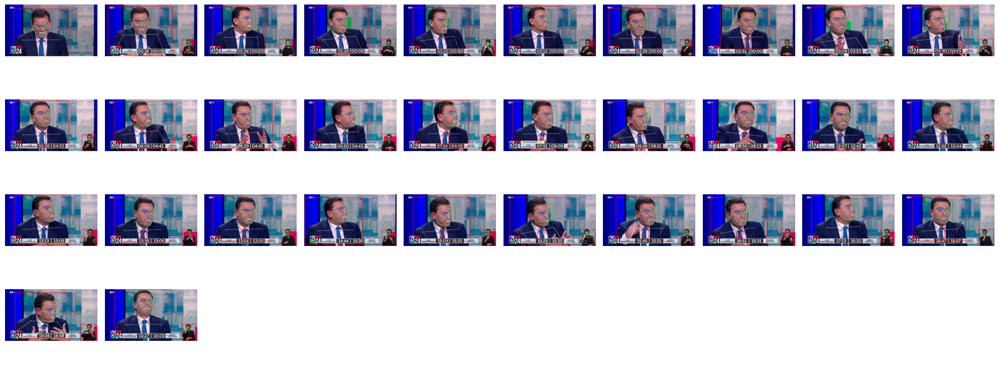

In [8]:

image_dir = r"C:\\git_projeto_todo\\BigData\\images_adchega"

# Get the cluster labels and image file names
cluster_labels = labels 
file_names = data1['filename'].tolist()  

# displaying cluster 2
selected_cluster = 1
selected_images = [image_dir + '\\' + file_names[i] for i in range(len(cluster_labels)) if cluster_labels[i] == selected_cluster]

####### plotting the images of cluster 2 ########

# Select every 20th image
every_20th_image = selected_images[::20]

# Calculate the number of rows needed
images_per_row = 10
num_rows = (len(every_20th_image) + images_per_row - 1) // images_per_row

# Create a figure with subplots
fig, axs = plt.subplots(num_rows, images_per_row, figsize=(20, num_rows * 2))

# Flatten axes array
axs = axs.ravel()

# Loop through the list of images and the axes
for ax, img_path in zip(axs, every_20th_image):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis('off')  # Turn off axis

# Hide any unused axes if there are any
for ax in axs[len(every_20th_image):]:
    ax.axis('off')

plt.tight_layout()  # Adjust subplots to fit into figure area.
plt.show()

It is not really accurate... because if you notice Montenegro, Ventura and the reporter are quite look a like phisically

Lets try a different approach:

--> Try doing the same for the debate with BE and CDU since they are the "most phisically different" people in the whole debates

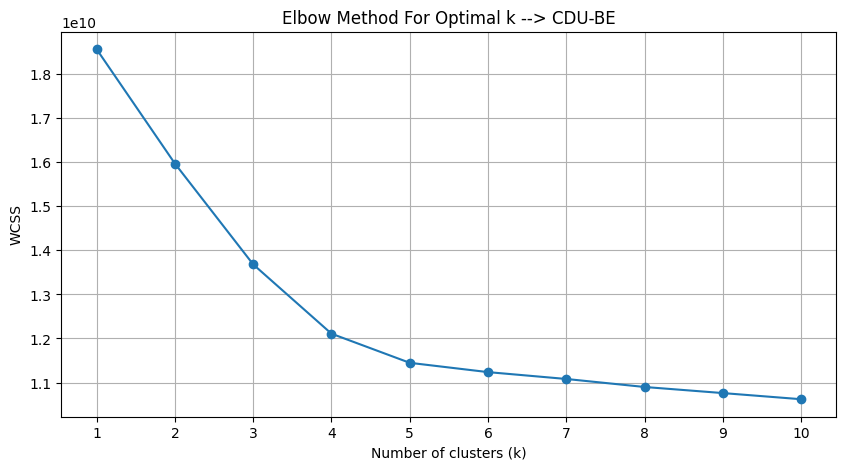

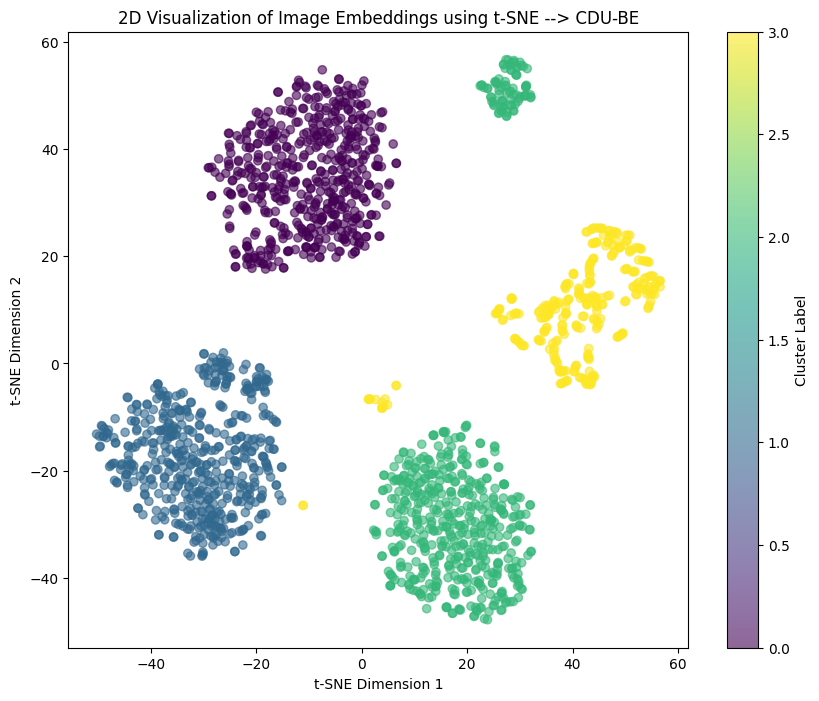

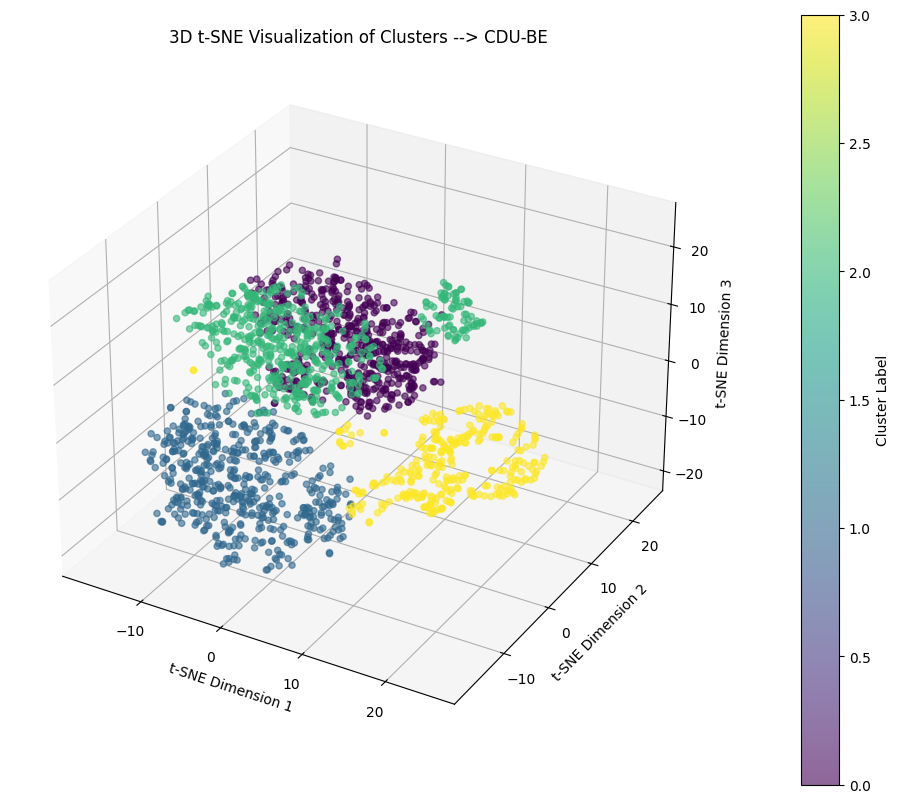

Displaying images for Cluster 0:


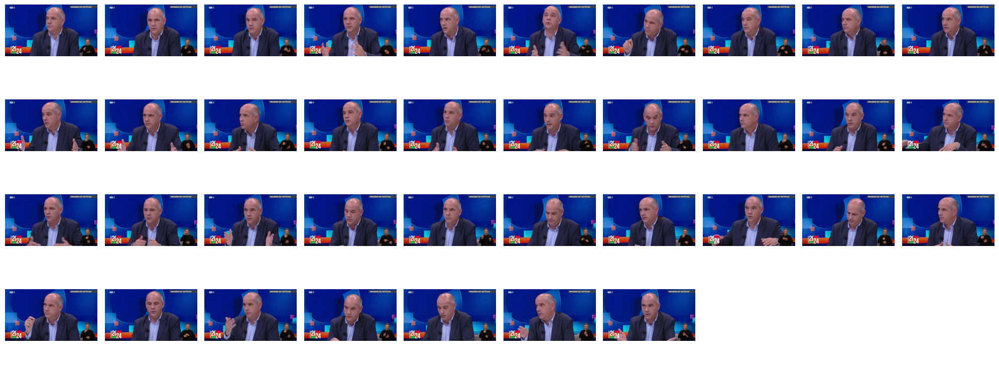

Displaying images for Cluster 1:


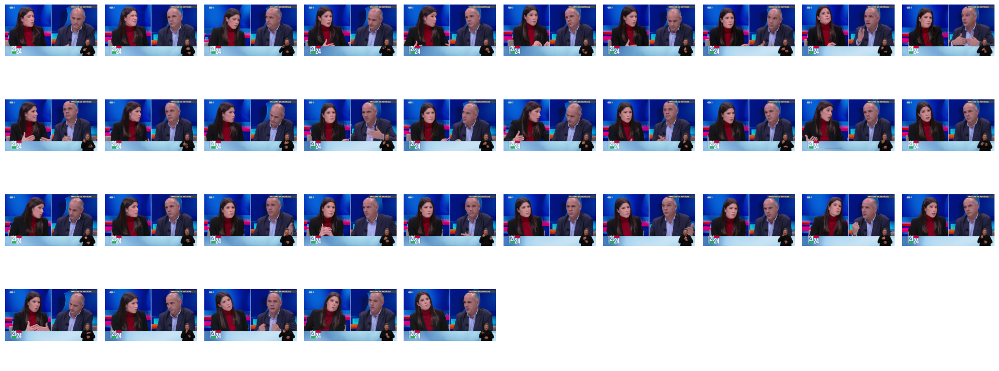

Displaying images for Cluster 2:


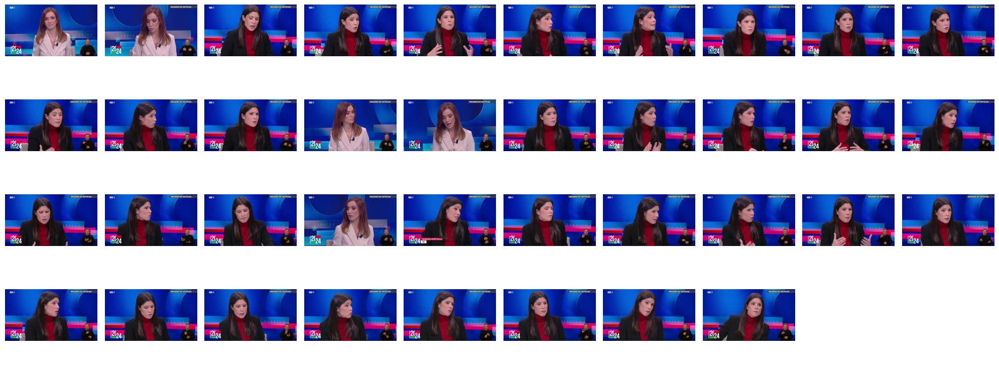

Displaying images for Cluster 3:


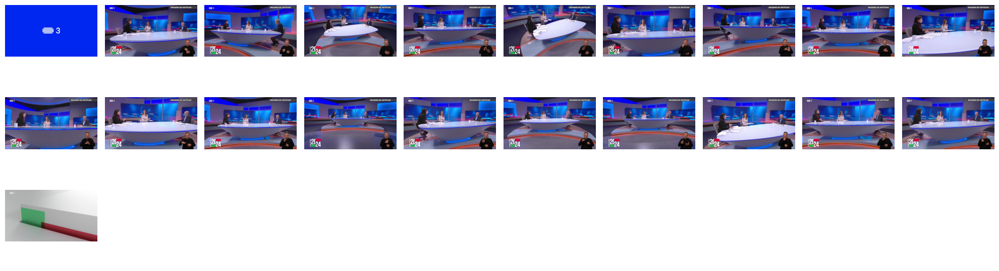

In [9]:

# Load the pickle file into a DataFrame
data2 = pd.read_pickle('pkl_files\\cdu-be.pkl')
data2 = data2.sort_values(by='filename')

# Extract image embeddings
image_embeddings_cdu_be = np.stack(data2.iloc[:, 5].to_numpy()) # numpy array of image embeddings

############### Elbow Method to determine the optimal number of clusters ###############

# Calculate WCSS for different numbers of clusters
wcss1 = []
for i in range(1, 11):  # Assuming testing for 1 to 10 clusters
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(image_embeddings_cdu_be)
    wcss1.append(kmeans.inertia_)

# Plotting the results onto a line graph
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), wcss1, marker='o')
plt.title('Elbow Method For Optimal k --> CDU-BE')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.xticks(range(1, 11))  # Ensuring only whole numbers appear as x-ticks
plt.grid(True)
plt.show()


############################################# Clustering for 2D dimension #############################################
# Step 1: K-means Clustering
num_clusters = 4
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
labels = kmeans.fit_predict(image_embeddings_cdu_be)

# Step 2: Dimensionality Reduction with t-SNE
tsne = TSNE(n_components=2, random_state=42)  # Use n_components=3 for 3D visualization
reduced_data1 = tsne.fit_transform(image_embeddings_cdu_be)

# Step 3: Plotting the results in 2D
plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced_data1[:, 0], reduced_data1[:, 1], c=labels, cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Cluster Label')
plt.title('2D Visualization of Image Embeddings using t-SNE --> CDU-BE')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

############################################# Clustering for 3D dimension #############################################
# Perform K-means clustering
kmeans = KMeans(n_clusters=4, random_state=42)
labels1 = kmeans.fit_predict(image_embeddings_cdu_be)

# Apply t-SNE for dimensionality reduction to 3 dimensions
tsne = TSNE(n_components=3, random_state=42)
reduced_data2 = tsne.fit_transform(image_embeddings_cdu_be)

# Create a 3D scatter plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(reduced_data2[:, 0], reduced_data2[:, 1], reduced_data2[:, 2], c=labels, cmap='viridis', alpha=0.6)

colorbar = fig.colorbar(scatter, ax=ax, pad=0.1)
colorbar.set_label('Cluster Label')

# Setting labels and title
ax.set_title('3D t-SNE Visualization of Clusters --> CDU-BE')
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.set_zlabel('t-SNE Dimension 3')

# Show plot
plt.show()

################################################## Displaying the images ##################################################

image_dir = r"C:\\git_projeto_todo\\BigData\\images_becdu"

# Get the cluster labels and image file names
cluster_labels = labels1
file_names = data2['filename'].tolist()

# Function to display images in a cluster
def display_cluster_images(cluster_num, cluster_labels, interval=15):
    selected_images = [image_dir + '\\' + file_names[i] for i in range(len(cluster_labels)) if cluster_labels[i] == cluster_num]
    
    # Select every nth image based on the interval
    selected_images = selected_images[::interval]
    
    if selected_images:
        print(f"Displaying images for Cluster {cluster_num}:")

        # Number of images per row
        images_per_row = 10

        # Calculate the number of rows needed
        num_rows = (len(selected_images) + images_per_row - 1) // images_per_row

        # Create a figure with subplots
        fig, axs = plt.subplots(num_rows, images_per_row, figsize=(20, num_rows * 2))

        # Flatten axes array
        axs = axs.ravel()

        counter = 0
        # Loop through the list of images and the axes
        for ax, img_path in zip(axs, selected_images):
            counter += 1
            img = Image.open(img_path)
            ax.imshow(img)
            ax.axis('off')  # Turn off axis

        # Hide any unused axes if there are any
        for ax in axs[len(selected_images):]:
            ax.axis('off')

        plt.tight_layout()  # Adjust subplots to fit into figure area.
        plt.show()
    else:
        print(f"No images found in cluster {cluster_num}.")


# Display images for each cluster with the specified interval
for cluster_num in range(num_clusters):
    display_cluster_images(cluster_num, cluster_labels, interval=15)


Its almost perfect, but the clustering is still mixing Mariana and the eporter. If we try to do the clustering with 5 clusters, instead of the differentiation between Mariana and the reporter, we will split Paulo Raimundo in two. So, now we will try to do the same but with the spectral clustering algorithm and see if it gives us better results. 

c:\Users\berna\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:301: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



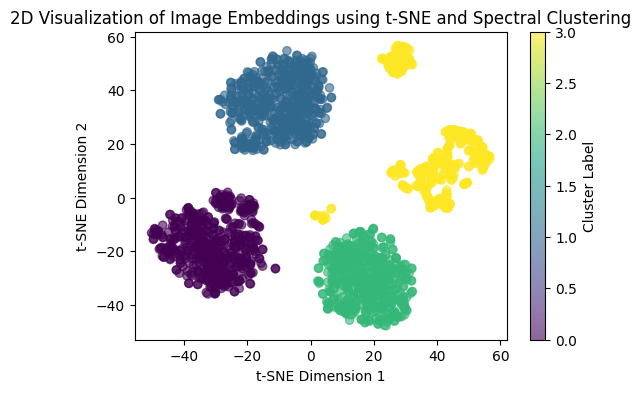

c:\Users\berna\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:301: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



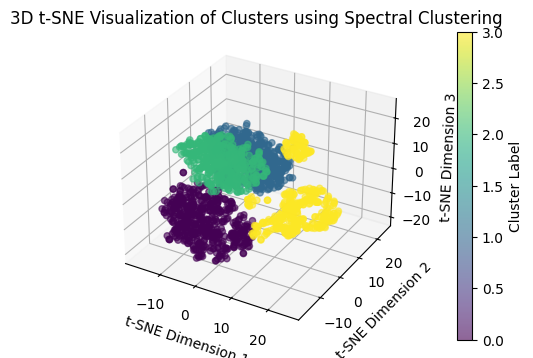

Displaying images for Cluster 0:


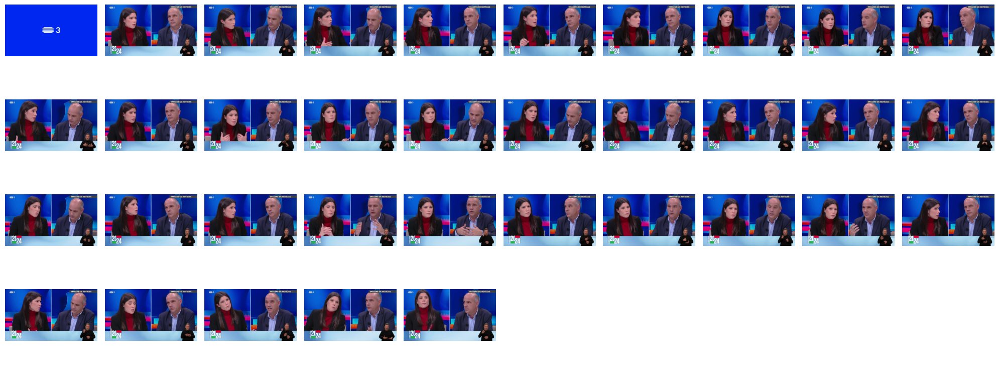

Displaying images for Cluster 1:


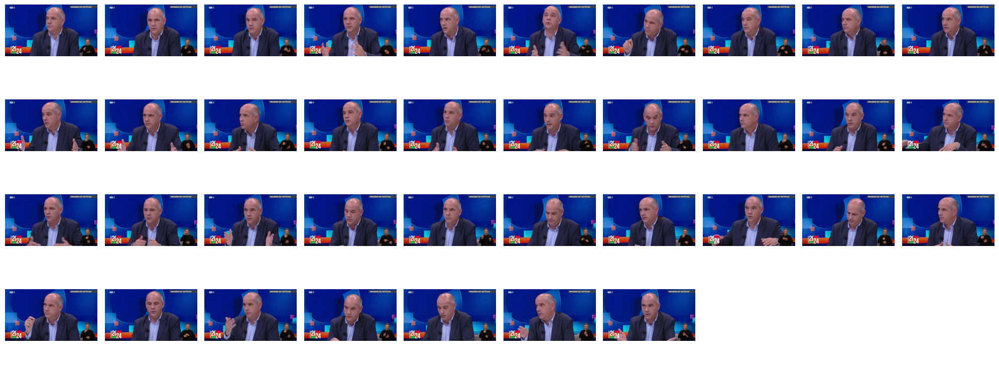

Displaying images for Cluster 2:


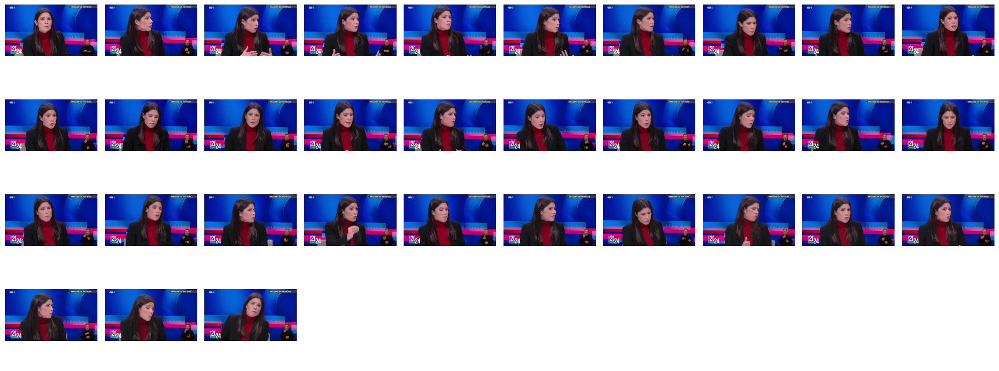

Displaying images for Cluster 3:


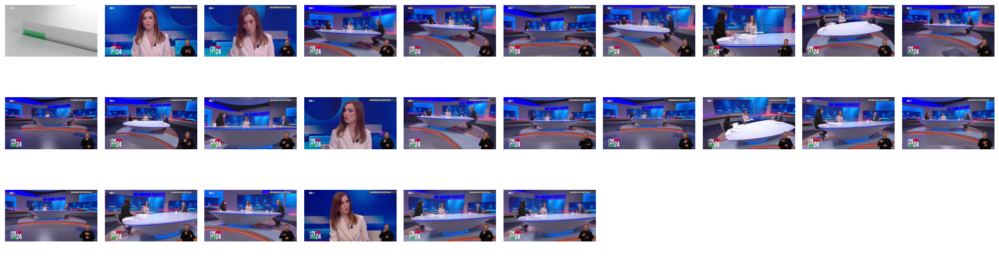

In [11]:

from sklearn.cluster import SpectralClustering
from sklearn.neighbors import kneighbors_graph
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

############################################# Clustering for 2D dimension #############################################
# Step 1: Spectral Clustering
num_clusters = 4
connectivity = kneighbors_graph(image_embeddings_cdu_be, n_neighbors=10, include_self=False)
spectral = SpectralClustering(n_clusters=num_clusters, affinity='nearest_neighbors', random_state=42, assign_labels='kmeans')
labels3 = spectral.fit_predict(image_embeddings_cdu_be)

# Step 2: Dimensionality Reduction with t-SNE
tsne = TSNE(n_components=2, random_state=42)
reduced_data3 = tsne.fit_transform(image_embeddings_cdu_be)

# Step 3: Plotting the results in 2D
plt.figure(figsize=(6, 4))
scatter = plt.scatter(reduced_data3[:, 0], reduced_data3[:, 1], c=labels3, cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Cluster Label')
plt.title('2D Visualization of Image Embeddings using t-SNE and Spectral Clustering')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

########################### Now in 3 Dimensions ###########################

# Perform Spectral clustering
spectral = SpectralClustering(n_clusters=4, affinity='nearest_neighbors', random_state=42, assign_labels='kmeans')
labels4 = spectral.fit_predict(image_embeddings_cdu_be)

# Apply t-SNE for dimensionality reduction to 3 dimensions
tsne = TSNE(n_components=3, random_state=42)
reduced_data4 = tsne.fit_transform(image_embeddings_cdu_be)

# Create a 3D scatter plot
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(reduced_data4[:, 0], reduced_data4[:, 1], reduced_data4[:, 2], c=labels4, cmap='viridis', alpha=0.6)

# Color bar indicating cluster label
colorbar = fig.colorbar(scatter, ax=ax, pad=0.1)
colorbar.set_label('Cluster Label')

# Setting labels and title
ax.set_title('3D t-SNE Visualization of Clusters using Spectral Clustering')
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.set_zlabel('t-SNE Dimension 3')

# Show plot
plt.show()

# Display images for each cluster
for cluster_num in range(num_clusters):
    display_cluster_images(cluster_num, labels4, interval=15)

It is mixing the reporter and the back plan. So, now we will try to identify 5 clusters with spectral clustering to see if it will give us a different cluster only for the reporter

c:\Users\berna\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:301: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



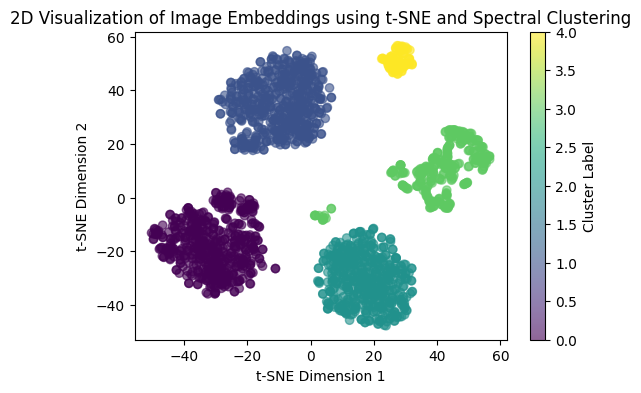

c:\Users\berna\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:301: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



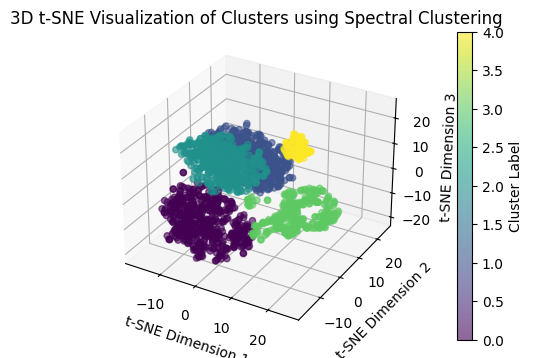

Displaying images for Cluster 0:


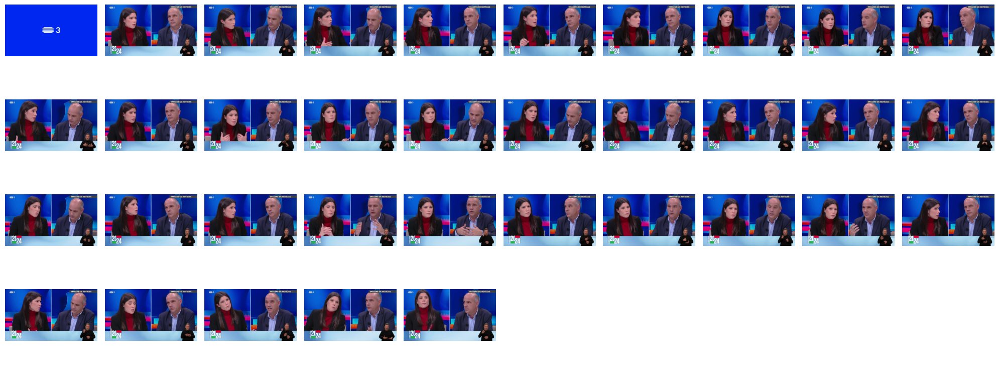

Displaying images for Cluster 1:


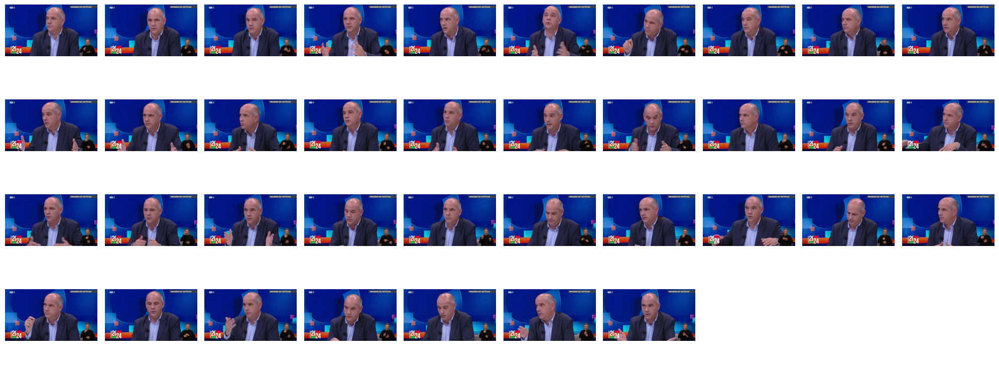

Displaying images for Cluster 2:


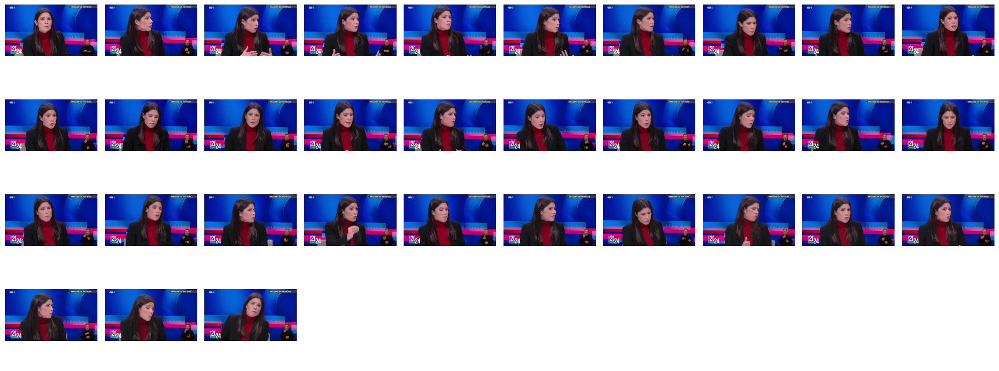

Displaying images for Cluster 3:


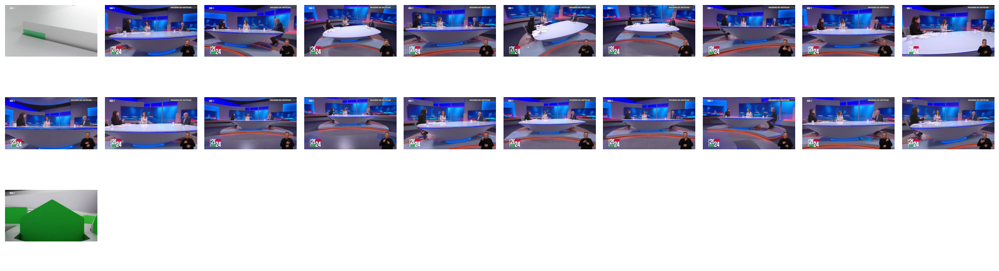

Displaying images for Cluster 4:


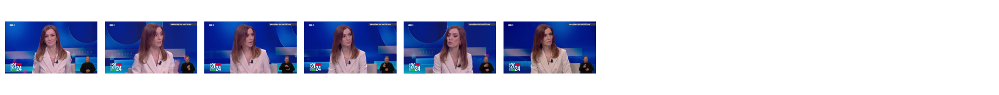

In [12]:
# Perform spectral clustering

############################################# Clustering for 2D dimension #############################################
# Step 1: Spectral Clustering
num_clusters = 5
connectivity = kneighbors_graph(image_embeddings_cdu_be, n_neighbors=10, include_self=False)
spectral = SpectralClustering(n_clusters=num_clusters, affinity='nearest_neighbors', random_state=42, assign_labels='kmeans')
labels5 = spectral.fit_predict(image_embeddings_cdu_be)

# Step 2: Dimensionality Reduction with t-SNE
tsne = TSNE(n_components=2, random_state=42)
reduced_data5 = tsne.fit_transform(image_embeddings_cdu_be)

# Step 3: Plotting the results in 2D
plt.figure(figsize=(6, 4))
scatter = plt.scatter(reduced_data5[:, 0], reduced_data5[:, 1], c=labels5, cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Cluster Label')
plt.title('2D Visualization of Image Embeddings using t-SNE and Spectral Clustering')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

########################### Now in 3 Dimensions ###########################

# Perform Spectral clustering
spectral = SpectralClustering(n_clusters=5, affinity='nearest_neighbors', random_state=42, assign_labels='kmeans')
labels6 = spectral.fit_predict(image_embeddings_cdu_be)

# Apply t-SNE for dimensionality reduction to 3 dimensions
tsne = TSNE(n_components=3, random_state=42)
reduced_data6 = tsne.fit_transform(image_embeddings_cdu_be)

# Create a 3D scatter plot
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(reduced_data6[:, 0], reduced_data6[:, 1], reduced_data6[:, 2], c=labels6, cmap='viridis', alpha=0.6)

# Color bar indicating cluster label
colorbar = fig.colorbar(scatter, ax=ax, pad=0.1)
colorbar.set_label('Cluster Label')

# Setting labels and title
ax.set_title('3D t-SNE Visualization of Clusters using Spectral Clustering')
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.set_zlabel('t-SNE Dimension 3')

# Show plot
plt.show()

# Display images for each cluster
for cluster_num in range(num_clusters):
    display_cluster_images(cluster_num, labels6, interval=15)

CORRECT! The clustering is well done with 5 clusters and using the spectral algorithm clustering